# Modelo No Supervisado: K-Means

El uso del modelo K-means en el presente proyecto, es apropiado porque nos permite agrupar los restaurantes en clústeres, según su ubicación (latitud y longitud) y analizar cómo las características geográficas, culturales y del mercado influyen en la oferta y el rendimiento de los restaurantes latinos. Esto proporciona una base sólida para la toma de decisiones estratégicas, para nuestro cliente.

Importamos la librerías a utilizar

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", palette="muted")
import warnings
warnings.filterwarnings("ignore")

### 1. Preparamos los datos

In [2]:
df_model = pd.read_csv('D:/2024/HenryData/PF/Otros/df_google_yelp.csv')
#D:\2024\HenryData\PF\Otros\df_google_yelp.csv

In [3]:
df_model.head(2)

,id,name,address,state_name,latitude,longitude,avg_rating,review,CreditCards,OutdoorSeating,TakeOut,cat_restaurante brasileño,cat_restaurante caribeño,cat_restaurante centroamericano,cat_restaurante chileno,cat_restaurante colombiano,cat_restaurante cubano,cat_restaurante dominicano,cat_restaurante ecuatoriano,cat_restaurante latinoamericano,cat_restaurante mexicano,cat_restaurante paraguayo,cat_restaurante peruano,cat_restaurante puertorriqueño,cat_restaurante uruguayo,cat_restaurante venezolano
0,0x808f879f35b5088b:0xe3541cec7a95bd88,tacos la cabana,"2015 22nd ave, oakland, ca 94606",California,37.789076,-122.233884,5.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,0x89c244427d3e2c19:0xc1dbf7d8e71d7201,casa malinche,"3078 coney island ave, brooklyn, ny 11235",New York,40.581086,-73.960139,4.4,7.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [4]:
# Eliminaremos las columnas que no aportan al modelo
drop_columns = ['id','name','address','state_name']
df_model = df_model.drop(columns=drop_columns, axis=1)

In [5]:
df_model= df_model.rename(columns={'review':'num_of_reviews'})

In [6]:
# Verificar valores nulos
print(df_model.isnull().sum())

# Eliminar filas con valores nulos si las hay
df_model = df_model.dropna()

# Estandarizar variables categóricas
categorical_columns = ['CreditCards','OutdoorSeating','TakeOut']
df_model[categorical_columns] = df_model[categorical_columns].astype(int)

latitude                           0
longitude                          0
avg_rating                         0
num_of_reviews                     0
CreditCards                        0
OutdoorSeating                     0
TakeOut                            0
cat_restaurante brasileño          0
cat_restaurante caribeño           0
cat_restaurante centroamericano    0
cat_restaurante chileno            0
cat_restaurante colombiano         0
cat_restaurante cubano             0
cat_restaurante dominicano         0
cat_restaurante ecuatoriano        0
cat_restaurante latinoamericano    0
cat_restaurante mexicano           0
cat_restaurante paraguayo          0
cat_restaurante peruano            0
cat_restaurante puertorriqueño     0
cat_restaurante uruguayo           0
cat_restaurante venezolano         0
dtype: int64


In [7]:
df_model.head(2)

,latitude,longitude,avg_rating,num_of_reviews,CreditCards,OutdoorSeating,TakeOut,cat_restaurante brasileño,cat_restaurante caribeño,cat_restaurante centroamericano,cat_restaurante chileno,cat_restaurante colombiano,cat_restaurante cubano,cat_restaurante dominicano,cat_restaurante ecuatoriano,cat_restaurante latinoamericano,cat_restaurante mexicano,cat_restaurante paraguayo,cat_restaurante peruano,cat_restaurante puertorriqueño,cat_restaurante uruguayo,cat_restaurante venezolano
0,37.789076,-122.233884,5.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,40.581086,-73.960139,4.4,7.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [8]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14978 entries, 0 to 14977
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   latitude                         14978 non-null  float64
 1   longitude                        14978 non-null  float64
 2   avg_rating                       14978 non-null  float64
 3   num_of_reviews                   14978 non-null  float64
 4   CreditCards                      14978 non-null  int32  
 5   OutdoorSeating                   14978 non-null  int32  
 6   TakeOut                          14978 non-null  int32  
 7   cat_restaurante brasileño        14978 non-null  int64  
 8   cat_restaurante caribeño         14978 non-null  int64  
 9   cat_restaurante centroamericano  14978 non-null  int64  
 10  cat_restaurante chileno          14978 non-null  int64  
 11  cat_restaurante colombiano       14978 non-null  int64  
 12  cat_restaurante cu

In [41]:
from sklearn.preprocessing import StandardScaler
# Seleccionar las características para el clustering
# Escalar los datos para clustering
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_model[['latitude', 'longitude']])

### 2. Determinamos el número óptimo de clústeres

In [42]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

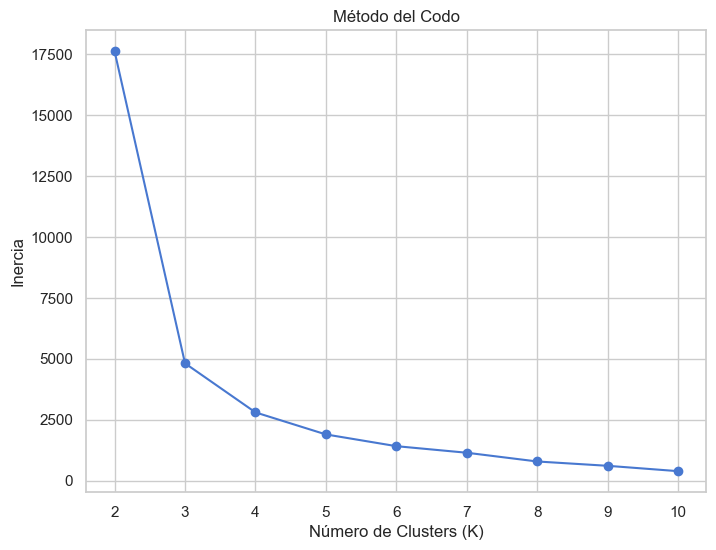

In [43]:
# Evaluar múltiples valores de K
inertia = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia, marker='o')
plt.title("Método del Codo")
plt.xlabel("Número de Clusters (K)")
plt.ylabel("Inercia")
plt.show()

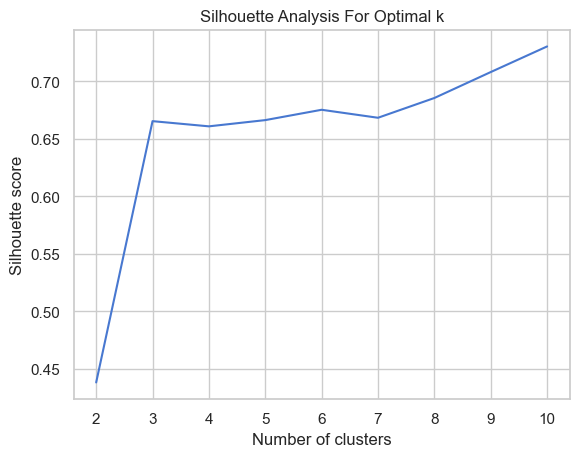

In [44]:
# Índice de silueta
silhouette_avg = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_data)
    silhouette_avg.append(silhouette_score(scaled_data, kmeans.labels_))
plt.plot(range(2, 11), silhouette_avg) 
plt.title('Silhouette Analysis For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

### 3. Entrenamiento del Modelo de Clustering

In [54]:
# Creamos y entrenamos el modelo KMeans
kmeans_model = KMeans(n_clusters=4, random_state=42)  # 5 clusters
kmeans_model.fit(scaled_data)

# Agregar los clusters al DataFrame original
df_model['cluster'] = kmeans_model.labels_

### 4. Análisis de los Resultados

In [63]:
# Resumir estadísticas por cluster
cluster_summary = df_model.groupby('cluster').agg({
    'avg_rating': ['mean', 'median', 'std'],
    'num_of_reviews': ['mean', 'median', 'std'],
    'CreditCards': 'mean',
    'OutdoorSeating': 'mean',
    'TakeOut': 'mean'
}).reset_index()

# Renombrar las columnas para facilitar la lectura
cluster_summary.columns = ['cluster', 'avg_rating_mean', 'avg_rating_median', 'avg_rating_std',
                           'num_of_reviews_mean', 'num_of_reviews_median', 'num_of_reviews_std',
                           'Takeout_mean', 'Outdoor_seating_mean', 'Credit_cards_mean']

print(cluster_summary)

   cluster  avg_rating_mean  avg_rating_median  avg_rating_std  \
0        0         4.042989                4.2        0.701152   
1        1         4.153014                4.3        0.549551   
2        2         4.158642                4.2        0.538493   
3        3         4.249352                4.3        0.487900   

   num_of_reviews_mean  num_of_reviews_median  num_of_reviews_std  \
0           149.645691                   45.0          389.777912   
1           121.696251                   49.0          266.981347   
2           105.255991                   54.0          216.438385   
3           143.409798                   48.0          382.663307   

   Takeout_mean  Outdoor_seating_mean  Credit_cards_mean  
0      0.130985              0.123803           0.213406  
1      0.111172              0.150312           0.240720  
2      0.163762              0.078068           0.387800  
3      0.118714              0.115863           0.249352  


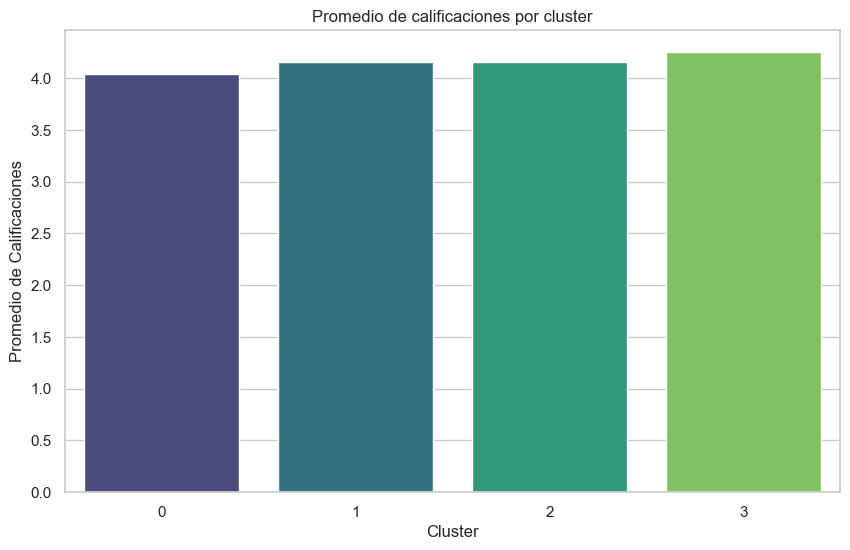

In [56]:
# Promedio de calificaciones por cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='avg_rating_mean', data=cluster_summary, palette='viridis')
plt.xlabel('Cluster')
plt.ylabel('Promedio de Calificaciones')
plt.title('Promedio de calificaciones por cluster')
plt.show()

Interpretación: 

- Estos valores indican la calificación promedio de los restaurantes en cada clúster.
- Clúster 3 tiene la mayor calificación promedio (4.25), lo que sugiere que este grupo incluye restaurantes con mejor percepción general por parte de los clientes.
- Clúster 0 tiene la calificación promedio más baja (4.04), lo que podría implicar que estos restaurantes enfrentan más problemas de calidad o satisfacción.
- Clústers 1 y 2, tienen calificaciones promedio similares.

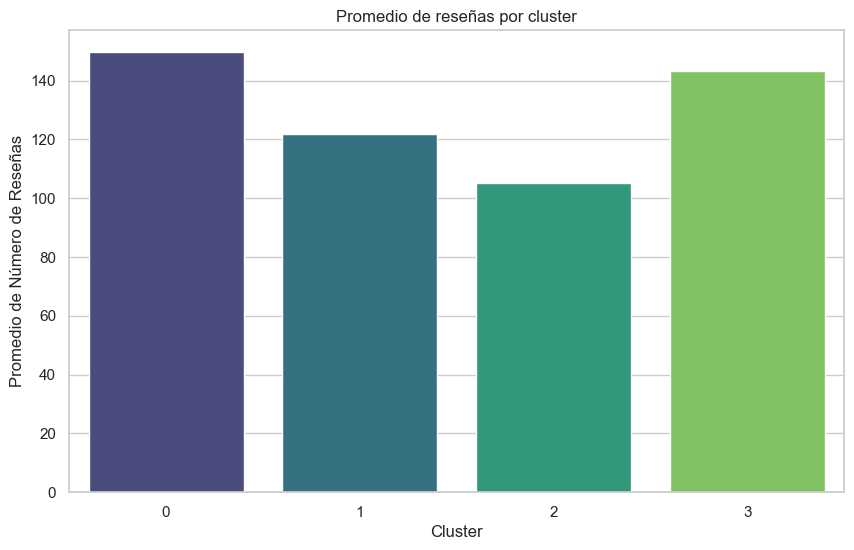

In [57]:
# Número promedio de reseñas por cluster
plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='num_of_reviews_mean', data=cluster_summary, palette='viridis')
plt.xlabel('Cluster')
plt.ylabel('Promedio de Número de Reseñas')
plt.title('Promedio de reseñas por cluster')
plt.show()

Interpretación:
- Las reseñas por Clusters, reflejan la cantidad de opiniones recibidas por los restaurantes en cada clúster.
- Clúster 0 y Clúster 3 tienen un promedio similar de opiniones, pero Clúster 0 tiene una desviación estándar más alta, indicando que algunos restaurantes tienen muchísimas opiniones mientras que otros tienen muy pocas.
- Clúster 2 tiene la menor cantidad promedio de opiniones (105), lo que sugiere menor popularidad o visibilidad.

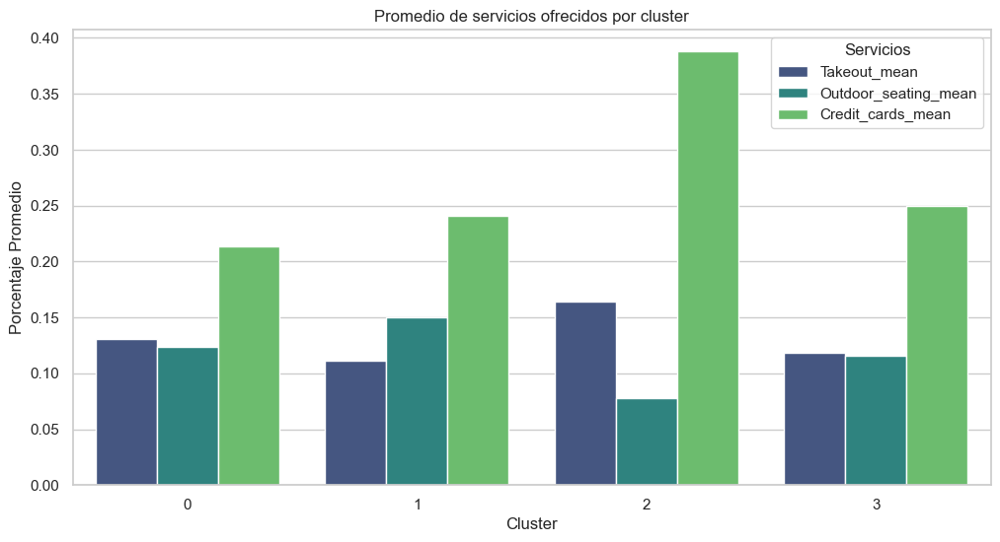

In [58]:
# Comparación de servicios ofrecidos entre clusters
features_binary = ['Takeout_mean', 'Outdoor_seating_mean', 'Credit_cards_mean']
cluster_summary_melted = cluster_summary.melt(id_vars=['cluster'], value_vars=features_binary, 
                                              var_name='Service', value_name='Mean')

plt.figure(figsize=(12, 6))
sns.barplot(x='cluster', y='Mean', hue='Service', data=cluster_summary_melted, palette='viridis')
plt.xlabel('Cluster')
plt.ylabel('Porcentaje Promedio')
plt.title('Promedio de servicios ofrecidos por cluster')
plt.legend(title='Servicios')
plt.show()

Interpretación:
- Takeout_mean: Los restaurantes del Clúster 2 tienen la mayor proporción de servicio para llevar (16.4%), mientras que el Clúster 1 tiene la menor (11.1%).
- Outdoor_seating_mean: Los restaurantes del Clúster 1 (15.0%) destacan por tener más opciones de asientos al aire libre, mientras que el Clúster 2 tiene la menor proporción (7.8%).
- Credit_cards_mean: El Clúster 2 también lidera en aceptación de tarjetas de crédito (38.7%), lo que podría estar relacionado con un segmento de mayor sofisticación o necesidades específicas del cliente.

Identificar las categorías de restaurantes latinos más común por cluster

In [59]:
# Paso 1: Seleccionar las columnas de interés
categorical_columns = [col for col in df_model.columns if col.startswith("cat_")]
df_categorias = df_model[categorical_columns + ["cluster"]]

# Paso 2: Sumar las ocurrencias por categoría en cada cluster
categorias_por_cluster = df_categorias.groupby("cluster").sum()

# Paso 3: Encontrar la categoría más común en cada cluster
categorias_por_cluster["categoria_mas_comun"] = categorias_por_cluster.idxmax(axis=1)

# Mostrar resultados
print(categorias_por_cluster)

         cat_restaurante brasileño  cat_restaurante caribeño  \
cluster                                                        
0                               60                       297   
1                               47                        42   
2                               19                       217   
3                               14                        37   

         cat_restaurante centroamericano  cat_restaurante chileno  \
cluster                                                             
0                                    100                        2   
1                                    210                        1   
2                                     95                        1   
3                                    130                        0   

         cat_restaurante colombiano  cat_restaurante cubano  \
cluster                                                       
0                               108                     424   
1          

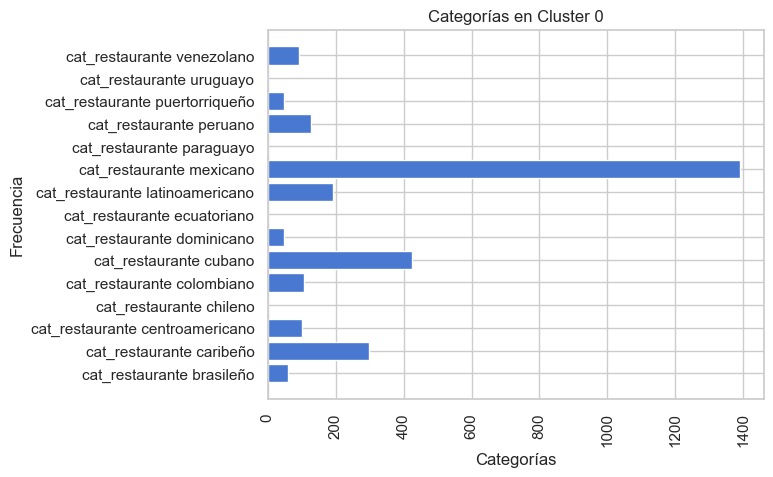

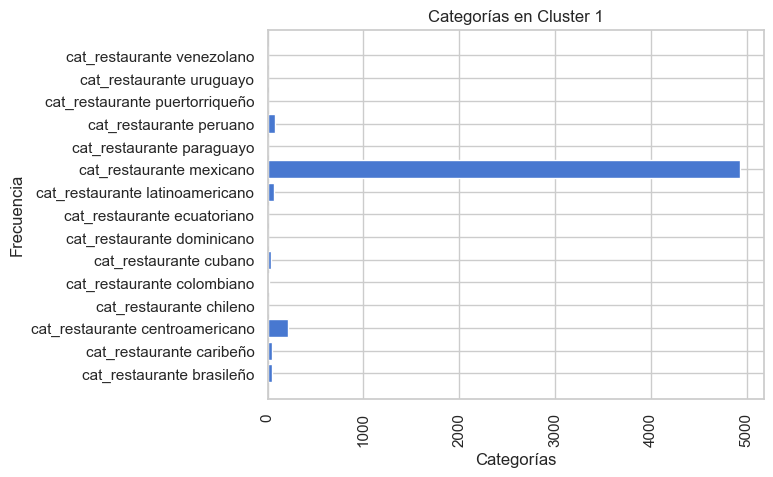

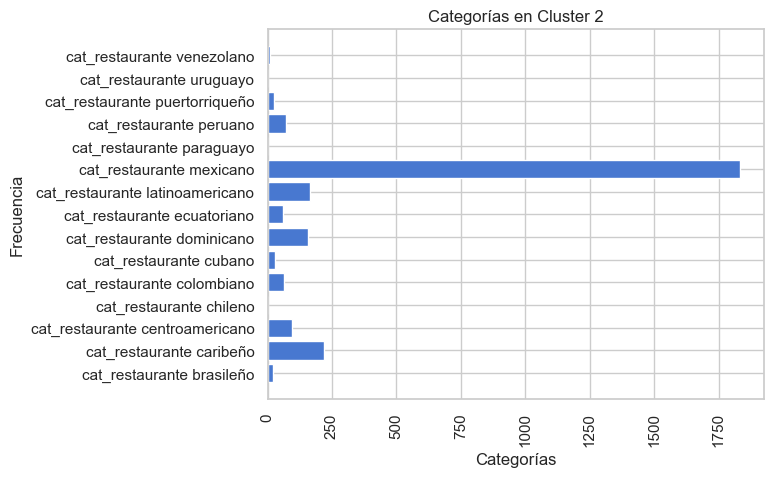

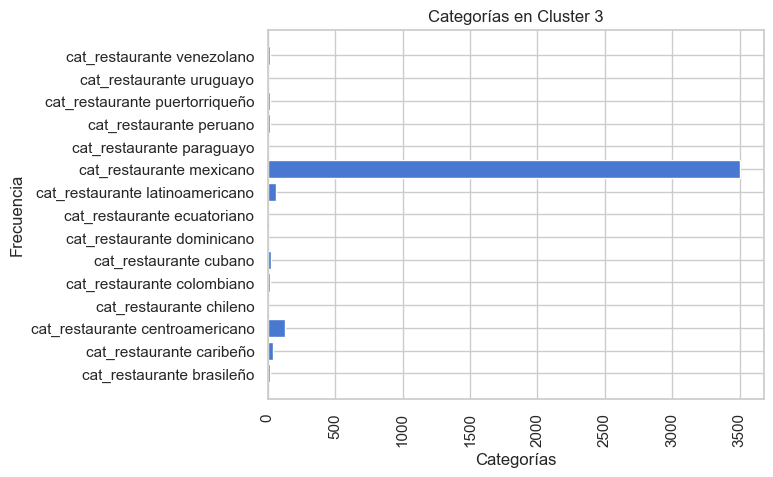

In [60]:
# Graficar la categoría más común por cluster
for cluster, row in categorias_por_cluster.iterrows():
    plt.barh(categorical_columns, row[:-1])
    plt.title(f"Categorías en Cluster {cluster}")
    plt.ylabel("Frecuencia")
    plt.xlabel("Categorías")
    plt.xticks(rotation=90)
    plt.show()

Interpretación:
En todos los clusters, la categoría dominante es restaurantes mexicanos. Esto indica que esta categoría es la más representativa dentro de los restaurantes latinos en Estados Unidos en los datos analizados.

### 5. Visualización de Clústeres

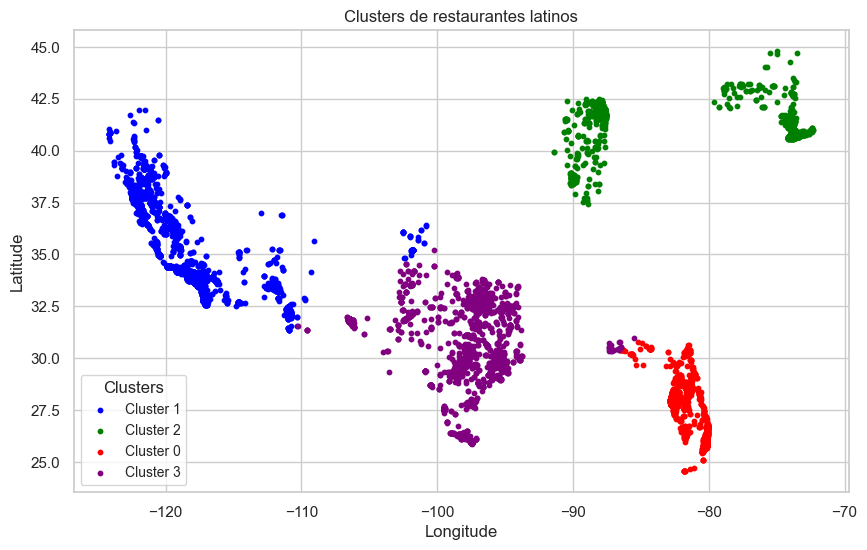

In [61]:
# Configurar el tamaño de la figura
plt.figure(figsize=(10, 6))

# Verificar si la columna 'cluster' existe y tiene valores válidos
if 'cluster' in df_model.columns and df_model['cluster'].notnull().any():
    clusters = df_model['cluster'].dropna().unique()  # Eliminar valores NaN y obtener valores únicos
    
    # Definir los colores según los clusters de la leyenda en la imagen
    cluster_colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'purple', 4: 'orange'}
    
    # Dibujar los puntos por cluster
    for cluster in clusters:
        color = cluster_colors.get(cluster, 'black')  # Asignar color o negro por defecto si falta
        subset = df_model[df_model['cluster'] == cluster]
        plt.scatter(subset['longitude'], subset['latitude'], 
                    label=f'Cluster {int(cluster)}', color=color, s=10)
    
    # Personalizar el gráfico
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Clusters de restaurantes latinos')
    
    # Agregar leyenda
    plt.legend(title="Clusters", loc='lower left', fontsize='small', title_fontsize='medium')
    
    # Mostrar el gráfico
    plt.show()
else:
    print("La columna 'cluster' no existe o no contiene valores válidos.")

In [52]:
from folium import plugins
import folium

In [65]:
# Asegurarse de que la columna 'cluster' sea un entero
df_model['cluster'] = df_model['cluster'].astype(int)

# Crear un mapa centrado en los datos
center_lat = df_model['latitude'].mean()
center_lon = df_model['longitude'].mean()
map_clusters = folium.Map(location=[center_lat, center_lon], zoom_start=5)

# Definir colores para cada cluster
colors = ['red', 'blue', 'green', 'purple', 'orange']

# Verificar que los clusters no excedan la cantidad de colores
unique_clusters = df_model['cluster'].unique()
if len(unique_clusters) > len(colors):
    raise ValueError("El número de clusters excede la cantidad de colores definidos.")

# Agregar puntos al mapa
for _, row in df_model.iterrows():
    cluster_id = int(row['cluster'])  # Asegurarnos de que sea un entero
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=colors[cluster_id],
        fill=True,
        fill_color=colors[cluster_id],
        fill_opacity=0.6
    ).add_to(map_clusters)

# Crear la leyenda personalizada en HTML
legend_html = '''
<div style="
    position: fixed; 
    bottom: 50px; left: 50px; width: 200px; height: 130px; 
    background-color: white; z-index:9999; font-size:14px;
    border:2px solid grey; padding: 10px;">
    <b>Clusters:</b><br>
    <i style="background: red; width: 10px; height: 10px; display: inline-block;"></i> Cluster 0<br>
    <i style="background: blue; width: 10px; height: 10px; display: inline-block;"></i> Cluster 1<br>
    <i style="background: green; width: 10px; height: 10px; display: inline-block;"></i> Cluster 2<br>
    <i style="background: purple; width: 10px; height: 10px; display: inline-block;"></i> Cluster 3<br>
    
</div>
'''

# Agregar la leyenda al mapa
map_clusters.get_root().html.add_child(folium.Element(legend_html))

# Mostrar el mapa
map_clusters

### 6. Conclusiones:

*- Clúster 0 (Rojo):*
- Ubicación principal: Concentrado principalmente en Florida.
- Interpretación:
    - Los restaurantes en este clúster tienen calificaciones promedio más bajas (4.04), pero una gran cantidad de reseñas (mayor variabilidad). Esto podría reflejar una alta competencia en Florida y una clientela exigente, ya que es un estado con una fuerte influencia latina y gran cantidad de turistas.
    - Estrategias de mejora para estos restaurantes podrían centrarse en aumentar la calidad del servicio o productos para elevar las calificaciones.
- Oferta gastronómica destacada:
    - Dominan los restaurantes cubanos (424) y caribeños (297).
    - También son comunes los restaurantes colombianos (108), centroamericanos (100) y peruanos (128).

*- Clúster 1 (Azul):*
- Ubicación principal: Principalmente en la costa oeste, incluyendo California y estados cercanos.
- Interpretación:
    - Este clúster tiene una buena calificación promedio (4.15) y el mayor porcentaje de restaurantes con asientos al aire libre (15%). Esto podría estar relacionado con el clima favorable de la región y la cultura de disfrutar al aire libre.
    - Los restaurantes en este grupo parecen estar orientados hacia un público que valora la experiencia más que el volumen, ya que el número de reseñas promedio es menor en comparación con el Clúster 0.
- Oferta gastronómica destacada:
    - El predominio absoluto de restaurantes mexicanos (4929) sobresale en este clúster.
    - Presencia limitada de otras categorías como caribeños (42) y centroamericanos (210).

*- Clúster 2 (Verde):*
- Ubicación principal: Concentrado en el noreste (Nueva York y alrededores) y en el medio oeste (Illinois).
- Interpretación:
    - Este clúster combina buenas calificaciones (4.16) con una mayor proporción de restaurantes que ofrecen servicios como takeout (16.4%) y aceptación de tarjetas de crédito (38.7%). Esto sugiere que estos restaurantes están adaptados a un público más urbano y demandante, que prioriza la conveniencia y la facilidad de pago.
    - La ubicación en áreas metropolitanas altamente pobladas podría explicar el enfoque en servicios para llevar y pago con tarjeta.
- Oferta gastronómica destacada:
    - Aunque los restaurantes mexicanos (1833) son la categoría más común, también hay una notable presencia de dominicanos (155) y caribeños (217).
    - Hay una representación significativa de ecuatorianos (59), colombianos (63) y peruanos (73).

*- Clúster 3 (Morado):*
- Ubicación principal: Concentrado en el sur y centro de Estados Unidos, principalmente Texas y estados circundantes.
- Interpretación:
    - Este clúster incluye los restaurantes con las mejores calificaciones promedio (4.25) y una alta cantidad de reseñas. Esto sugiere que los restaurantes latinos en estas áreas tienen una percepción altamente positiva y son populares.
    - Dado que Texas tiene una gran población latina, los restaurantes en este clúster podrían estar beneficiándose de una fuerte conexión cultural con sus clientes.
- Oferta gastronómica destacada:
    - Predominan los restaurantes mexicanos (3502), pero también hay una representación de centroamericanos (130) y venezolanos (20).

### 7. Guardamos el modelo y el DataFrame que incluye la etiqueta de Clusters

In [66]:
# Importamos la librería
import joblib

In [67]:
# Guardar el modelo
joblib.dump(kmeans_model, 'kmeans_model.joblib')

['kmeans_model.joblib']

In [68]:
# Guardar el DataFrame en un archivo CSV
df_model.to_csv('df_model_cluster.csv', index=False)
print("Archivo guardado exitosamente.")

Archivo guardado exitosamente.


### 8. Prueba de concepto del modelo

In [69]:
# Cargar el modelo y predecir
loaded_model = joblib.load('kmeans_model.joblib')
new_restaurant = [[40.7128, -74.0060]]
predicted_cluster = loaded_model.predict(new_restaurant)
print("El nuevo restaurante pertenece al cluster:", predicted_cluster[0])

El nuevo restaurante pertenece al cluster: 1
